# 10wk-1: 중간고사

최규빈  
2025-05-07

<a href="https://colab.research.google.com/github/guebin/DL2025/blob/main/posts/mid.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" style="text-align: left"></a>

In [41]:
import torch
import torchvision
import pandas 
import matplotlib.pyplot as plt 

# `1`. 기본문법 – 10점

`(1)` 아래는 각각 horizontal edge, vertical edge를 의미하는 2개의
컨볼루션 필터를 설계한 것이다.

In [245]:
h_conv = torch.nn.Conv2d(
    in_channels=1,
    out_channels=1,
    kernel_size=4,
    bias=False
)
h_conv.weight.data = torch.tensor([[[
    [ 0, 0, 0, 0],
    [ 0, -1.0, -1.0, 0],
    [0, 1.0, 1.0, 0],
    [ 0, 0, 0, 0]
]]])
v_conv = torch.nn.Conv2d(
    in_channels=1,
    out_channels=1,
    kernel_size=4,
    bias=False
)
v_conv.weight.data = torch.tensor([[[
    [ 0, 0, 0, 0],
    [ 0, 1.0, -1.0, 0],
    [0, 1.0, -1.0, 0],
    [ 0, 0, 0, 0]
]]])

위의 계수값을 활용하여 `in_channels=1`, `out_channels=2`,
`kernel_size=4` 인 새로은 convolution filter를 설계하고 첫번째
아웃풋채널은 horizontal edge 을 두번째 아웃풋 채널은 vertical edge을
의미하도록 하라.

**hint:**

-   `torch.concat`을 활용해야합니다.
-   07wk-2강의노트를 참고하세요

`(2)` 아래는 10장의 (28,28) 칼라이미지를 나타내는 자료이다.

In [251]:
X = torch.rand(10,3,28,28)

따라서 이미지의 각 pixel에는 3개의 숫자가 존재한다. 아래의 선형변한을
수행하여 이미지의 각 pixel에 적용하여 3개의 숫자를 하나로 줄이는 코드를
작성하라.

In [253]:
linr = torch.nn.Linear(3,1,bias=False)

**hint**:

-   변환후의 차원은 (10,1,28,28) 이어야 합니다.
-   `torch.einsum`을 활용해야합니다.
-   08wk-2강의노트를 참고하세요

# `2`. 파라메터 count – 10점

**note:**

1.  학습가능한 파라메터가 동일할 경우 동일하다고 답할것.
2.  해설쓸 필요 없이 답만 쓸 것

`(1)` net1과 net2중 학습가능한 파라메터가 더 많은 쪽은 어디인가?

In [258]:
net1 = torch.nn.Sequential(
    torch.nn.Linear(10,1, bias=False),
    torch.nn.Sigmoid()
)
net2 = torch.nn.Sequential(
    torch.nn.Linear(10,1, bias=True)
)

`(2)` net1과 net2중 학습가능한 파라메터가 더 많은 쪽은 어디인가?

In [43]:
net1 = torch.nn.Sequential(
    torch.nn.Linear(10,5),
    torch.nn.Dropout(0.5),
    torch.nn.ReLU(),
    torch.nn.Linear(5,1)
    
)
net2 = torch.nn.Sequential(
    torch.nn.Linear(10,5),
    torch.nn.ReLU(),
    torch.nn.Linear(5,1)
)

`(3)` conv1과 conv2중 학습가능한 파라메터가 더 많은 쪽은 어디인가?

In [44]:
conv1 = torch.nn.Conv2d(
    in_channels=1, 
    out_channels=1, 
    kernel_size=3
)
conv2 = torch.nn.Conv2d(
    in_channels=1, 
    out_channels=1, 
    kernel_size=5
)

`(4)` conv1과 conv2중 학습가능한 파라메터가 더 많은 쪽은 어디인가?

In [45]:
conv1 = torch.nn.Conv2d(
    in_channels=1, 
    out_channels=2, 
    kernel_size=3
)
conv2 = torch.nn.Conv2d(
    in_channels=1, 
    out_channels=1, 
    kernel_size=3
)

`(5)` conv1과 conv2중 학습가능한 파라메터가 더 많은 쪽은 어디인가?

In [46]:
conv1 = torch.nn.Conv2d(
    in_channels=1, 
    out_channels=2, 
    kernel_size=3,
    stride=1
)
conv2 = torch.nn.Conv2d(
    in_channels=1, 
    out_channels=2, 
    kernel_size=3,
    stride=2
)

# `3`. 최적화 – 20점

In [213]:
torch.manual_seed(43052)
dist = torch.distributions.Exponential(1/2)
x = dist.sample((10000,1))

주어진 자료 $x_i$에 대하여 함수 $l(\lambda)$를 최대화하는 $\lambda$를
경사하강법 기반의 알고리즘을 이용하여 추정하라. 단 이때 $\lambda$의 초기
추정값은 1로 설정하라.

$$
l(\lambda) =\frac{1}{n} \sum_{i=1}^{n}\log f(x_i), \quad f(x_i) = \frac{1}{\lambda} e^{-\frac{x_i}{\lambda}}, \quad x_i \geq 0
$$

**hint**

-   $l(\lambda)$를 최대화하는 $\lambda$는 $-l(\lambda)$를 최소화합니다.
-   이론적으로는 $l(\lambda)$를 최대화하는 $\lambda$는 `x.mean()`입니다.
    즉 제대로 $\lambda$를 추정한다면 `x.mean()`이 나오도록 되어있습니다.
-   저는 경사하강법을 이용했고 학습률은 0.05로 설정했습니다. 1000회
    update하니까 잘 수렴했습니다.

# `4`. 회귀 – 20점

자유 낙하 운동이란 어떤 물체가 일정한 높이에서 떨어져 지면에 도달하기
까지 걸리는 시간을 다루는 물리학 개념이다. 다음은 물리학의 자유 낙하
운동에서 착안하여 생성한 데이터이다.

In [233]:
h = torch.rand(100)*100
h,_ = h.sort()
h = h.reshape(100,1)
t = torch.sqrt(2*h/9.8) + torch.randn([100,1])*0.1

여기에서 $h$는 낙하전의 높이(단위: m), $t$는 해당높이에서 물치가 지면에
도달하기 까지 걸리는 시간(단위:초)을 의미한다. 예를 들어 아래의 자료는
$h=97.7798, t=4.4356$를 의미하는데

In [242]:
h[-1], t[-1]

이것은 높이 $97.7798$m에서 낙하한 물체가 약 $4.4356$초만에 지면에
도달했음을 의미한다. 아래의 그림은 $x$축에 $h$, $y$축에 $t$를 두고 해당
데이터를 산점도로 시각화 한 것이다.

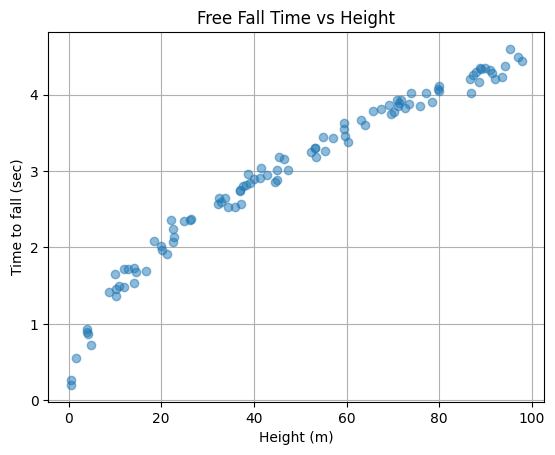

In [243]:
plt.plot(h,t,'o',alpha=0.5)
plt.xlabel('Height (m)')
plt.ylabel('Time to fall (sec)')
plt.title('Free Fall Time vs Height')
plt.grid(True)
plt.show()

그래프를 보면 높이가 높을 수록 낙하시간도 길어지는 경향이 관찰된다. 다만
동일한 높이라 하더라도 낙하시간이 조금씩 차이나는 경우가 있는데, 이는
사람이 시간측정을 수동으로 하며 발생하는 실험오차 때문이다. 이러한
오차에도 불구하고 $h$와 $t$사이에는 일정한 규칙이 존재하는듯 하다.
물리학과 교수님께 자문을 요청한 결과 자유낙하에 걸리는 시간은
$\sqrt{h}$에 비례함을 알 수 있었고 이를 근거로 아래와 같은 모형을
설계하였다.

$$t_i = \beta_0 + \beta_1 \sqrt{h_i}+\epsilon_i, \quad \epsilon_i \sim {\cal N}(0,\sigma^2)$$

위의 모형을 활용하여 높이 $h$로부터 낙하시간 $t$를 예측하는 신경망
모델을 설계하고 학습하라. 학습한 신경망 모델을 활용하여 높이 40m,60m,80m
에서 물체를 자유낙하 시켰을때 지면에 도달하기까지 걸리는 시간을 각각
예측하라.

**hint**

-   $y_i = t_i$ 로 생각하시고 $x_i= \sqrt{h}_i$로 생각하시면 그냥
    회귀모형이죠?
-   답은 $2.8571$초, $3.4493$초, $4.0406$초 근처로 나오면 됩니다.
-   제시된 모형($t_i = \beta_0 + \beta_1 \sqrt{h_i}+\epsilon_i$)을
    무시하고 04wk-2와 같은 방식으로 신경망을 설계하고 푸셔도 만점으로
    인정합니다.

# `5`. 분류 – 10점

> 모든 문항을 맞출경우만 10점으로 인정

아래의 자료를 고려하자.

In [549]:
df = pd.read_csv("https://raw.githubusercontent.com/guebin/DL2025/main/posts/iris.csv")
df

위의 자료는 아이리스 데이터셋으로 머신러닝에서 자주 사용되는
분류(classification) 예제 데이터이다. 데이터는 다음과 같은 특징을 가지고
있다:

**샘플 수: 150개**

**특징 수: 4개**

-   꽃받침 길이 (sepal length)
-   꽃받침 너비 (sepal width)
-   꽃잎 길이 (petal length)
-   꽃잎 너비 (petal width)

**클래스 수: 3개 (각 50개 샘플)**

-   0: setosa
-   1: versicolor
-   2: virginica

`(1)` 주어진 데이터를 8:2 비율로 학습용(df_train)과
테스트용(df_test)으로 나누고, SepalLength, SepalWidth, PetalLength,
PetalWidth를 입력으로 하여 Species를 예측할 수 있도록 데이터를 텐서
형태로 변환하라.

hint: 아래의 코드를 활용할 것

``` python
df_train = df.sample(frac=0.8, random_state=42)
df_test = df.drop(df_train.index)
#---#
X = torch.tensor(df_train.iloc[:,:4].values).float()
y = ???
XX = ???
yy = ???
```

`(2)` 아래의 제약사항에 맞추어 Species를 예측할 수 있는 적당한
네트워크를 학습하라.

**제약사항**

-   학습 후 test accuracy 가 70% 이상일것
-   매 epoch마다 loss와 train accuracy를 출력할 것

> 시험시간에 학습할 필요 없이, 기존에 공부했던 코드를 그대로 결과로
> 제시해도 무방함.

# `6`. CNN – 20점

아래는 FashionMNIST 데이터셋을 불러와 torch tensor로 변환하는 코드이다.

In [36]:
df_train=pd.read_csv('https://media.githubusercontent.com/media/guebin/PP2023/main/posts/fashion-mnist_train.csv')
df_test=pd.read_csv('https://media.githubusercontent.com/media/guebin/PP2023/main/posts/fashion-mnist_test.csv')
X = torch.tensor(df_train.iloc[:, 1:].to_numpy().reshape(-1, 1, 28, 28),dtype=torch.float32)
XX = torch.tensor(df_test.iloc[:, 1:].to_numpy().reshape(-1, 1, 28, 28),dtype=torch.float32)
y = torch.tensor(df_train['label'].to_numpy(), dtype=torch.long)
yy = torch.tensor(df_test['label'].to_numpy(), dtype=torch.long)

여기에서 `X`, `y`는 학습 데이터와 라벨, `XX`, `yy`는 테스트 데이터와
라벨을 의미한다. 아래의 제약사항에 맞추어 이 데이터를 학습할 수 있는
적당한 네트워크를 학습하라.

**제약사항**

-   학습 후 test accuracy 가 70% 이상일것
-   매 epoch마다 loss와 train accuracy를 출력할 것
-   네트워크에 `torch.nn.Conv2d`를 반드시 포함시킬 것

# `7`. XAI – 10점

> (1)-(3) 모두 맞출경우만 10점으로 인정

아래의 코드를 이용하여 `OxfordIIITPet` 자료를 다운로드하고 물음에
답하라.

In [135]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category'
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category'
)

`(1)` 이 데이터를 사용하여 ResNet18을 기반으로 한 이진 분류 모델을 학습
및 평가하는 전체 파이프라인 코드를 작성하시오. 다음 제약사항을 만족해야
한다:

**제약사항**

-   각 이미지를 (512,512)로 리사이즈하고, torch.Tensor로 변환할 것 //
    메모리 이슈 발생시 (256,256)으로 리사이즈 할 것.
-   이용해 TensorDataset 및 DataLoader(batch_size=32)를 생성할 것 (학습
    데이터는 shuffle=True)
-   resnet18(pretrained=True)을 불러오고, 마지막 fully-connected layer를
    torch.nn.Linear(512,1)로 교체할 것 // 메모리 이슈 발생시
    torch.nn.Linear(256,1)로 교체할 것
-   손실함수는 torch.nn.BCEWithLogitsLoss(), 옵티마이저는
    torch.optim.Adam(resnet18.parameters(), lr=1e-5)로 설정할 것
-   3번의 epoch 동안 학습하고 매 epoch 마다 학습 데이터의 정확도를
    출력할 것
-   학습이 끝난 이후 테스트 데이터에 대해 정확도를 계산하여 출력할 것

`(2)` 아래의 이미지에 대한 로짓값과 그에 대응하는 확률값을 계산하고
인공지능이 이 이미지를 개라고 생각하는지 고양이라고 생각하는지 답하라.

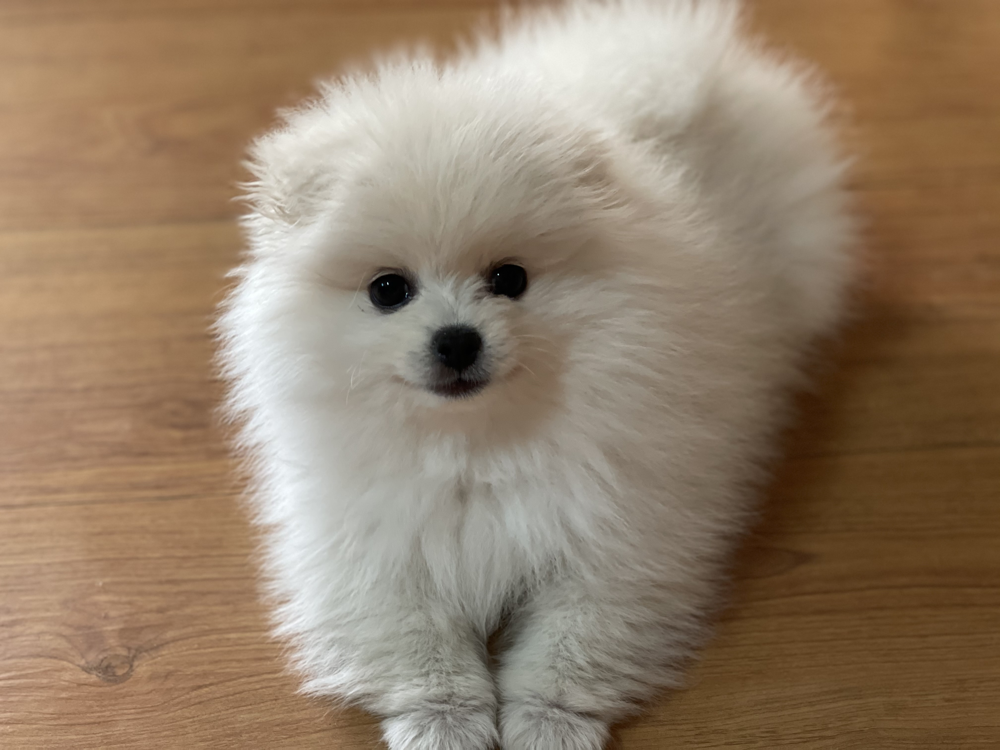

In [297]:
url = 'https://github.com/guebin/DL2025/blob/main/imgs/hani2.jpeg?raw=true'
hani_pil = PIL.Image.open(
    io.BytesIO(requests.get(url).content)
)
hani_pil

`(3)` (2)의 이미지에 대한 인공지능의 판단근거를 Class Activation Map
(CAM) (Zhou et al. 2016)을 이용하여 시각화하라.

# `8`. GAN – 10점

아래의 코드를 이용하여 `MNIST` 자료를 다운로드하라.

In [291]:
dataset = torchvision.datasets.MNIST(
    root = './data',
    download=True
)
to_tensor = torchvision.transforms.ToTensor()
X_real = torch.stack([to_tensor(Xi) for Xi, yi in dataset if yi==8])

이안굿펠로우의 generative adversarial networks (GAN) (Goodfellow et al.
2014) 을 활용하여 (n,6) shape의 노이즈를 입력으로 하고 (n,1,28,28) shape
의 가짜이미지를 생성하는 네트워크를 훈련하고 결과를 시각화하라. 시각화
예시는 아래와 같다.

![](https://github.com/guebin/DL2025/blob/main/posts/gan_results.png?raw=true)

Goodfellow, Ian, Jean Pouget-Abadie, Mehdi Mirza, Bing Xu, David
Warde-Farley, Sherjil Ozair, Aaron Courville, and Yoshua Bengio. 2014.
“Generative Adversarial Nets.” *Advances in Neural Information
Processing Systems* 27.

Zhou, Bolei, Aditya Khosla, Agata Lapedriza, Aude Oliva, and Antonio
Torralba. 2016. “Learning Deep Features for Discriminative
Localization.” In *Proceedings of the IEEE Conference on Computer Vision
and Pattern Recognition*, 2921–29.